In [1]:
import os
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import tifffile

from careamics import CAREamist, Configuration
from careamics.config import AlgorithmModel, CheckpointModel, DataModel, TrainingModel
from careamics.config.architectures import UNetModel
from careamics.config.optimizer_models import LrSchedulerModel, OptimizerModel
from careamics.utils.metrics import psnr

In [2]:
root_path = Path(os.getcwd())

### Data

In [3]:
data_path = Path("/group/jug/Vera/w2s_sample")
noisy_path = data_path / "w2s_noisy.tiff"
gt_path = data_path / "w2s_gt.tiff"

#### Explore

In [4]:
noisy = tifffile.imread(noisy_path)
noisy.shape

(3, 3, 512, 512)

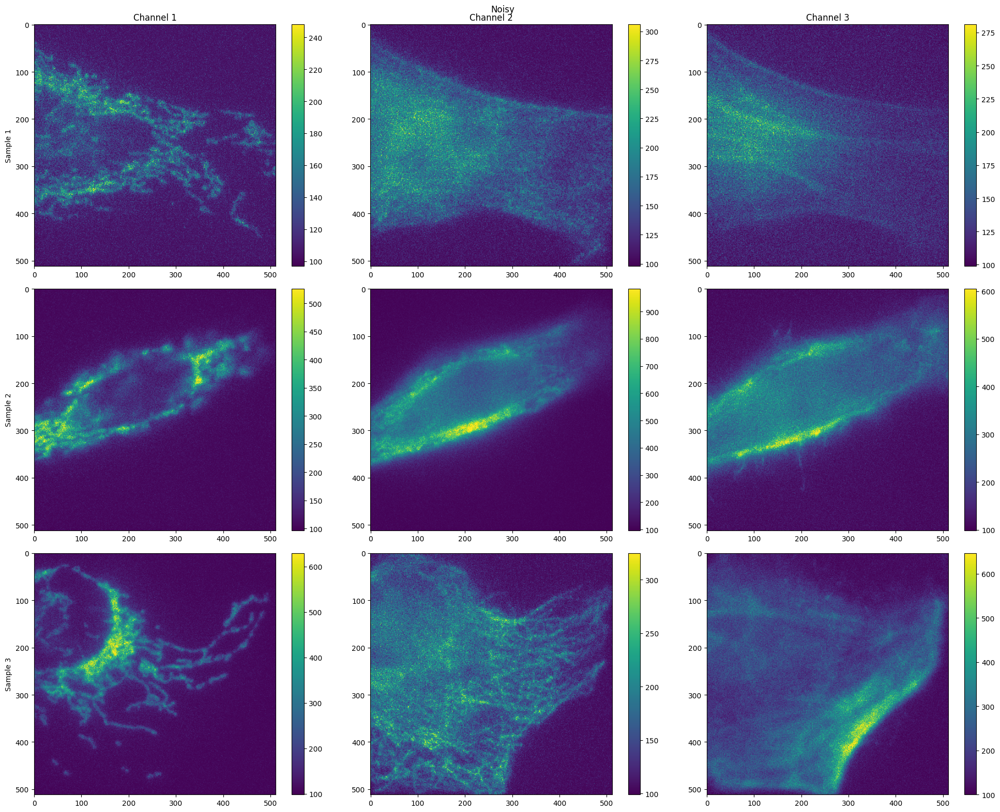

In [5]:
samples = 3
channels = 3
fig, axes = plt.subplots(samples, channels, figsize=(20, 16))
for i in range(samples):
    for j in range(channels):
        if i == 0:
            axes[j, 0].set_ylabel(f"Sample {j + 1}")
        if j == 0:
            axes[0, i].set_title(f"Channel {i + 1}")
        vmin = np.quantile(noisy[i, j], 0.001)
        vmax = np.quantile(noisy[i, j], 0.999)
        m = axes[i, j].imshow(noisy[i, j], vmin=vmin, vmax=vmax)
        plt.colorbar(m, ax=axes[i, j])
fig.suptitle("Noisy")
plt.tight_layout()

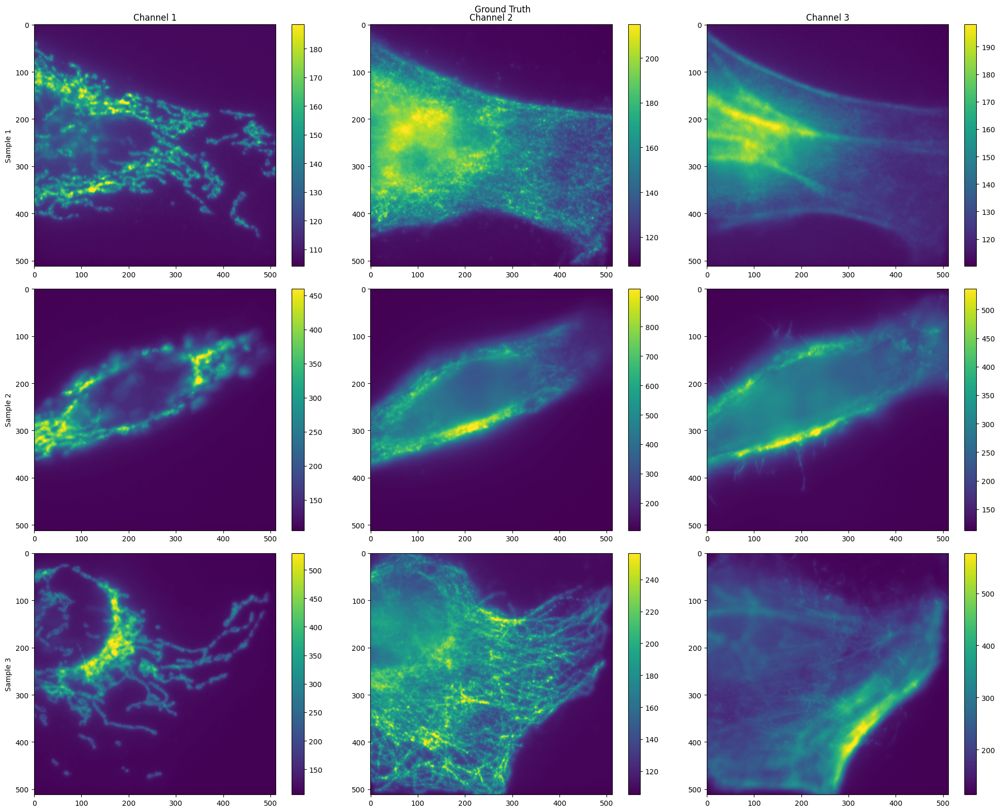

In [6]:
gt = tifffile.imread(gt_path)

fig, axes = plt.subplots(samples, channels, figsize=(20, 16))
for i in range(samples):
    for j in range(channels):
        if i == 0:
            axes[j, 0].set_ylabel(f"Sample {j + 1}")
        if j == 0:
            axes[0, i].set_title(f"Channel {i + 1}")
        vmin = np.quantile(gt[i, j], 0.001)
        vmax = np.quantile(gt[i, j], 0.999)
        m = axes[i, j].imshow(gt[i, j], vmin=vmin, vmax=vmax)
        plt.colorbar(m, ax=axes[i, j])
fig.suptitle("Ground Truth")
plt.tight_layout()

## Train with channels combined

### Configuration

In [7]:
alg_config = AlgorithmModel(
    algorithm="n2v",
    loss="n2v",
    model=UNetModel(
        architecture="UNet", in_channels=3, num_classes=3, ind_channels=False
    ),
    optimizer=OptimizerModel(lr=1e-3),
    lr_scheduler=LrSchedulerModel(factor=0.5, patience=10),
)
data_config = DataModel(
    data_type="array",
    patch_size=[64, 64],
    axes="CYX",
)
training_config = TrainingModel(
    num_epochs=10,
    batch_size=1,
    use_wandb=False,
    checkpoint_callback=CheckpointModel(save_last=True, save_top_k=3),
)

configuration = Configuration(
    experiment_name="channels_combined",
    algorithm_config=alg_config,
    data_config=data_config,
    training_config=training_config,
)

engine_comb = CAREamist(source=configuration, work_dir=root_path)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


### Training & prediction
train and predict for each sample seperately

In [8]:
pred_comb = np.zeros_like(noisy)
for i in range(samples):
    print(f"Sample {i}")
    engine_comb.train(train_source=noisy[i], val_percentage=0.1)
    pred_comb_sample = engine_comb.predict(source=noisy[i])
    pred_comb[[i]] = pred_comb_sample

Sample 0


You are using a CUDA device ('NVIDIA A40-8Q') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Computed dataset mean: 130.98261006673178, std: 32.492846326183916
/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/melisande.croft/Documents/Repos/careamics/examples/2D/n2v/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | UNet | 509 K 
-------------------------------
509 K     Trainable params
0         Non-trainable params
509 K     Total params
2.039     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.
/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Epoch 9: 100%|██████████| 58/58 [00:00<00:00, 78.73it/s, train_loss_step=1.26, val_loss=0.933, train_loss_epoch=0.861]  

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 58/58 [00:00<00:00, 68.05it/s, train_loss_step=1.26, val_loss=0.933, train_loss_epoch=0.861]


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Predicting: |          | 0/? [00:00<?, ?it/s]

Sample 1


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | UNet | 509 K 
-------------------------------
509 K     Trainable params
0         Non-trainable params
509 K     Total params
2.039     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | UNet | 509 K 
-------------------------------
509 K     Trainable params
0         Non-trainable params
509 K     Total params
2.039     Total estimated model params size (MB)


Sample 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

### Evaluate

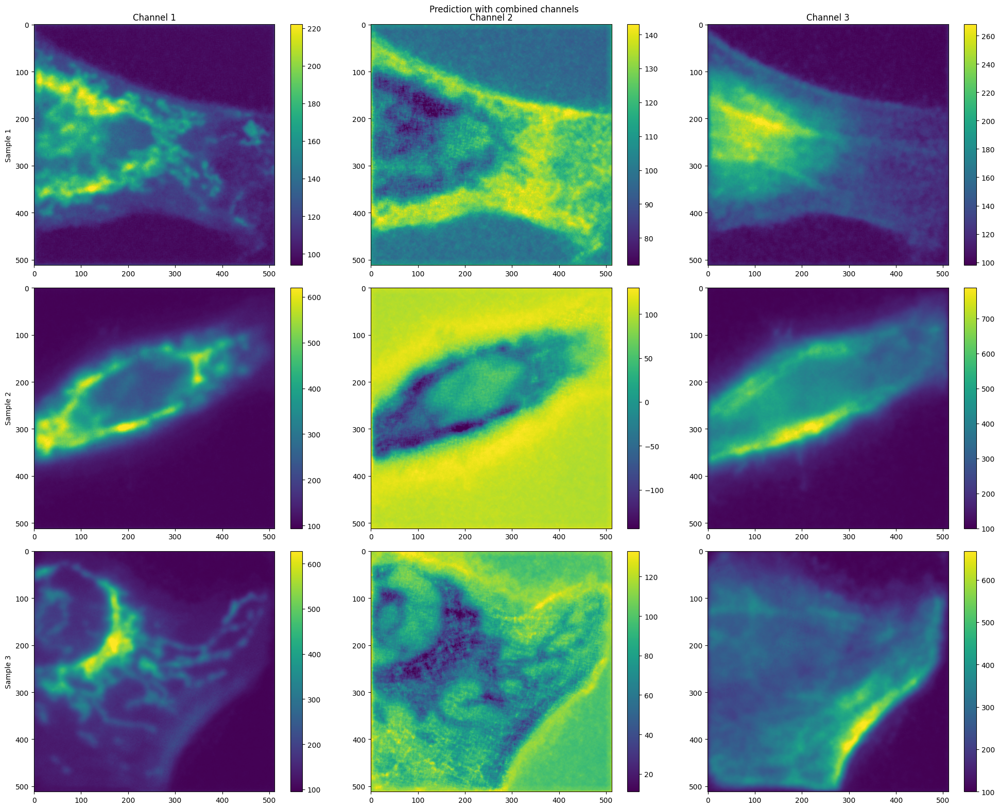

In [9]:
fig, axes = plt.subplots(samples, channels, figsize=(20, 16))
for i in range(samples):
    for j in range(channels):
        if i == 0:
            axes[j, 0].set_ylabel(f"Sample {j + 1}")
        if j == 0:
            axes[0, i].set_title(f"Channel {i + 1}")
        vmin = np.quantile(pred_comb[i, j], 0.001)
        vmax = np.quantile(pred_comb[i, j], 0.999)
        m = axes[i, j].imshow(pred_comb[i, j], vmin=vmin, vmax=vmax)
        plt.colorbar(m, ax=axes[i, j])
fig.suptitle("Prediction with combined channels")
plt.tight_layout()

In [10]:
psnr_matrix = np.array(
    [
        [psnr(gt[i, j], pred_comb[i, j], 2**16) for i in range(samples)]
        for j in range(channels)
    ]
)
psnr_matrix

array([[71.24381951, 58.91082396, 63.86178645],
       [63.35837148, 48.20640305, 57.65005062],
       [68.7248324 , 56.44361007, 62.34753095]])

## Train with channels independed

### Configuration

In [11]:
alg_config = AlgorithmModel(
    algorithm="n2v",
    loss="n2v",
    model=UNetModel(
        architecture="UNet", in_channels=3, num_classes=3, ind_channels=True
    ),
    optimizer=OptimizerModel(lr=1e-3),
    lr_scheduler=LrSchedulerModel(factor=0.5, patience=10),
)
data_config = DataModel(
    data_type="array",
    patch_size=[64, 64],
    axes="CYX",
)
training_config = TrainingModel(
    num_epochs=10,
    batch_size=1,
    use_wandb=False,
    checkpoint_callback=CheckpointModel(save_last=True, save_top_k=3),
)

configuration = Configuration(
    experiment_name="channels_combined",
    algorithm_config=alg_config,
    data_config=data_config,
    training_config=training_config,
)

engine_ind = CAREamist(source=configuration, work_dir=root_path)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


### Training & prediction
train and predict for each sample seperately

In [12]:
pred_ind = np.zeros_like(noisy)
for i in range(samples):
    print(f"Sample {i}")
    engine_ind.train(train_source=noisy[i], val_percentage=0.1)
    pred_ind_sample = engine_ind.predict(source=noisy[i])
    pred_ind[[i]] = pred_ind_sample

Computed dataset mean: 130.98261006673178, std: 32.492846326183916


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | UNet | 1.5 M 
-------------------------------
1.5 M     Trainable params
0         Non-trainable params
1.5 M     Total params
6.111     Total estimated model params size (MB)


Sample 0


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Epoch 9: 100%|██████████| 58/58 [00:01<00:00, 35.90it/s, train_loss_step=0.455, val_loss=1.62, train_loss_epoch=1.05] 

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 58/58 [00:01<00:00, 30.33it/s, train_loss_step=0.455, val_loss=1.62, train_loss_epoch=1.05]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | UNet | 1.5 M 
-------------------------------
1.5 M     Trainable params
0         Non-trainable params
1.5 M     Total params
6.111     Total estimated model params size (MB)


Sample 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | UNet | 1.5 M 
-------------------------------
1.5 M     Trainable params
0         Non-trainable params
1.5 M     Total params
6.111     Total estimated model params size (MB)


Sample 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

### Evaluate

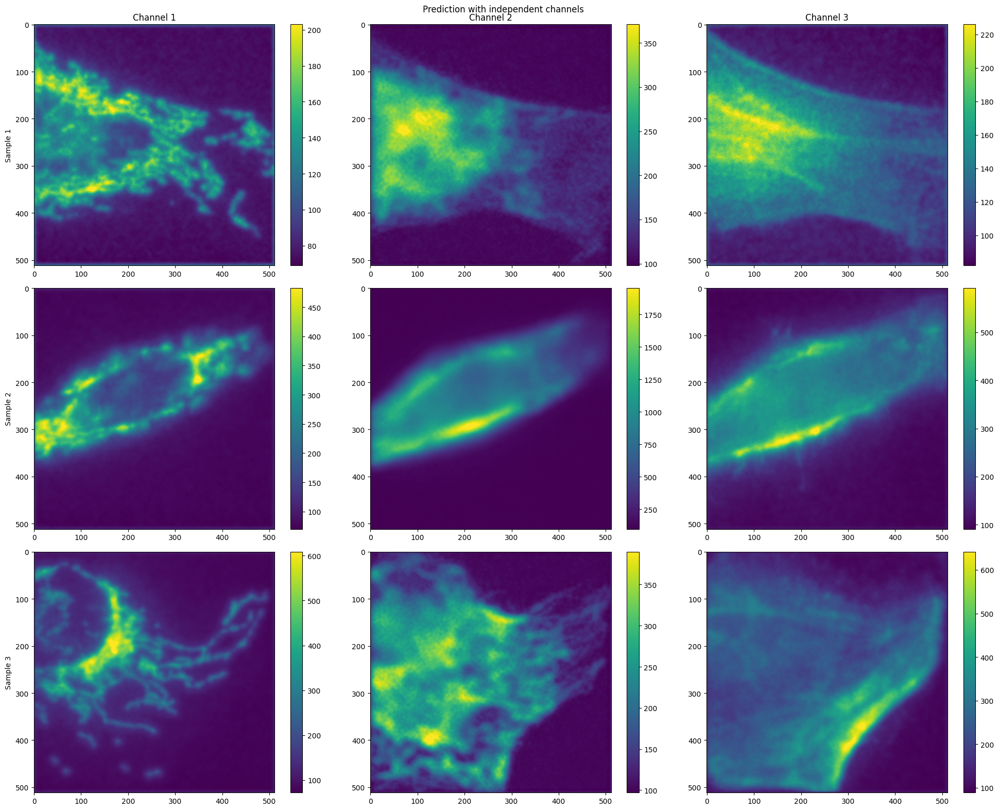

In [13]:
fig, axes = plt.subplots(samples, channels, figsize=(20, 16))
for i in range(samples):
    for j in range(channels):
        if i == 0:
            axes[j, 0].set_ylabel(f"Sample {j + 1}")
        if j == 0:
            axes[0, i].set_title(f"Channel {i + 1}")
        vmin = np.quantile(pred_ind[i, j], 0.001)
        vmax = np.quantile(pred_ind[i, j], 0.999)
        m = axes[i, j].imshow(pred_ind[i, j], vmin=vmin, vmax=vmax)
        plt.colorbar(m, ax=axes[i, j])
fig.suptitle("Prediction with independent channels")
plt.tight_layout()

In [14]:
psnr_matrix = np.array(
    [
        [psnr(gt[i, j], pred_ind[i, j], 2**16) for i in range(samples)]
        for j in range(channels)
    ]
)
psnr_matrix

array([[68.62058427, 67.21401327, 66.77342422],
       [63.18626028, 47.40070099, 61.90824757],
       [72.0023423 , 66.96430528, 67.40316954]])